# Load the Data

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE252132

In [19]:
import chardet

# Detect encoding
with open("../data/GSE252132_normalized_counts.txt", "rb") as file:
    result = chardet.detect(file.read())
    print(result)  # This will show the likely encoding of the file


{'encoding': 'UTF-16', 'confidence': 1.0, 'language': ''}


In [20]:
import pandas as pd

# Read the file with UTF-16 encoding
data = pd.read_csv("../data/GSE252132_normalized_counts.txt", sep="\t", encoding="utf-16")
print(data.head())


        ensembl_ID gene_symbol  Dox-Ctl_log2FC  Dox-Ctl_adjPval  \
0  ENSG00000107611        CUBN        5.379797     3.600000e-26   
1  ENSG00000117461      PIK3R3        1.473987     9.470000e-23   
2  ENSG00000162344       FGF19       -2.034191     1.430000e-19   
3  ENSG00000167513        CDT1       -0.868422     9.010000e-18   
4  ENSG00000166750       SLFN5        1.250271     4.540000e-17   

   AG25367_CTL_d2  35L11_CTL_d2  AG25367_CTL_d4  35L11_CTL_d4  AG25367_DOX_d2  \
0        2.948971      3.612845        3.624677      2.857944        8.136251   
1        8.952162      8.566980        8.964240      8.832016       10.093404   
2        8.196646      8.469808        7.792036      8.328218        6.402417   
3       11.682461     11.760476       11.771627     11.993710       10.941357   
4        8.135901      8.323855        8.124393      8.108006        9.269880   

   35L11_DOX_d2  AG25367_DOX_d4  35L11_DOX_d4  
0      7.541704        8.618604      7.059622  
1     10.33358

### Summary of Columns in Normalized Data

- ensembl_ID and gene_symbol: Gene identifiers.

- Dox-Ctl_log2FC: Log2 fold-change of gene expression between Dox-treated and control conditions (positive values indicate up-regulation in Dox-treated samples, negative values indicate down-regulation).

- Dox-Ctl_adjPval: Adjusted p-value indicating the statistical significance of the expression change after multiple testing correction.

- Expression Columns (e.g., AG25367_CTL_d2, 35L11_DOX_d2): Normalized gene expression values for each sample, with suffixes indicating the sample condition and time point (e.g., _CTL_ for control, _DOX_ for Dox-treated, _d2 for day 2).


This normalized data is ready for downstream analysis like DGE without additional transformations.

# Define Control and Treatment Groups

In [21]:
# Define control and treated groups based on column names
control_samples = [col for col in data.columns if "CTL" in col]
dox_samples = [col for col in data.columns if "DOX" in col]

# Separate data into control and Dox-treated samples
# Convert all expression columns to numeric, handling any non-numeric values if they exist
data[control_samples + dox_samples] = data[control_samples + dox_samples].apply(pd.to_numeric, errors='coerce')

# Check if conversion was successful by printing data types
print(data[control_samples + dox_samples].dtypes)


AG25367_CTL_d2    float64
35L11_CTL_d2      float64
AG25367_CTL_d4    float64
35L11_CTL_d4      float64
AG25367_DOX_d2    float64
35L11_DOX_d2      float64
AG25367_DOX_d4    float64
35L11_DOX_d4      float64
dtype: object


# Calculate Log Fold Change

Since the Dox-Ctl_log2FC is already provided, we use it directly without additional calculation.

**Dox-Ctl_log2FC** column: shows Log2 fold-change of gene expression between Dox-treated and control conditions (positive values indicate up-regulation in Dox-treated samples, negative values indicate down-regulation).

# Perform Differential Expression Analysis

Use a t-test for each gene to compare means between control and Dox-treated samples. We’ll loop through each gene and apply the test.

In [22]:
import numpy as np
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt

# Perform Statistical Testing
# Initialize list to store results
results = []

# Conduct t-test for each gene comparing control vs. Dox-treated
for idx, row in data.iterrows():
    gene = row["gene_symbol"]
    # Explicitly convert control and dox values to numpy arrays of type float
    control_values = np.array(row[control_samples], dtype=float)
    dox_values = np.array(row[dox_samples], dtype=float)
    t_stat, p_value = ttest_ind(control_values, dox_values, nan_policy='omit')  # Ignore NaNs if any
    results.append([gene, t_stat, p_value])

# Convert results to DataFrame
results_df = pd.DataFrame(results, columns=["Gene", "t_stat", "p_value"])


/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/Users/samaneh/opt/anaconda3/envs/myv

- Convert Row Selections to Numpy Arrays: By explicitly converting control_values and dox_values to np.array(..., dtype=float), we ensure that these slices are of a numeric type compatible with ttest_ind.

- nan_policy='omit': We continue to ignore NaNs, if present, within the t-test function.

In [23]:
results_df.head()

,Gene,t_stat,p_value
0,CUBN,-11.481289,0.000026
1,PIK3R3,-11.459700,0.000027
2,FGF19,10.965632,0.000034
3,CDT1,12.425526,0.000017
4,SLFN5,-11.217949,0.000030


# Multiple Testing Correction

In [24]:
# Filter out genes with missing data in either group
data_filtered = data.dropna(subset=control_samples + dox_samples)

# Perform Statistical Testing on Filtered Data
results = []
for idx, row in data_filtered.iterrows():
    gene = row["gene_symbol"]
    control_values = np.array(row[control_samples], dtype=float)
    dox_values = np.array(row[dox_samples], dtype=float)
    t_stat, p_value = ttest_ind(control_values, dox_values, nan_policy='omit')
    results.append([gene, t_stat, p_value])

# Convert results to DataFrame
results_df = pd.DataFrame(results, columns=["Gene", "t_stat", "p_value"])

# Ensure p_values are numeric
results_df["p_value"] = pd.to_numeric(results_df["p_value"], errors='coerce')

# Adjust for Multiple Testing (FDR Correction) on valid p-values only
non_nan_indices = results_df["p_value"].notna()  # Get indices where p_value is not NaN
results_df["adjusted_p_value"] = np.nan  # Initialize adjusted column with NaNs
results_df.loc[non_nan_indices, "adjusted_p_value"] = multipletests(results_df.loc[non_nan_indices, "p_value"], method="fdr_bh")[1]


/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/Users/samaneh/opt/anaconda3/envs/myv

In [25]:
results_df.head()

,Gene,t_stat,p_value,adjusted_p_value
0,CUBN,-11.481289,0.000026,0.03412
1,PIK3R3,-11.459700,0.000027,0.03412
2,FGF19,10.965632,0.000034,0.03412
3,CDT1,12.425526,0.000017,0.03412
4,SLFN5,-11.217949,0.000030,0.03412


 # Identify Differentially Expressed Genes (DEGs)

In [26]:
# Filter Differentially Expressed Genes (DEGs)
significance_threshold = 0.05
degs = results_df[results_df["adjusted_p_value"] < significance_threshold]

# Add log2 fold change from original data
degs = degs.merge(data[["gene_symbol", "Dox-Ctl_log2FC"]], left_on="Gene", right_on="gene_symbol", how="left")


# Visualize Results

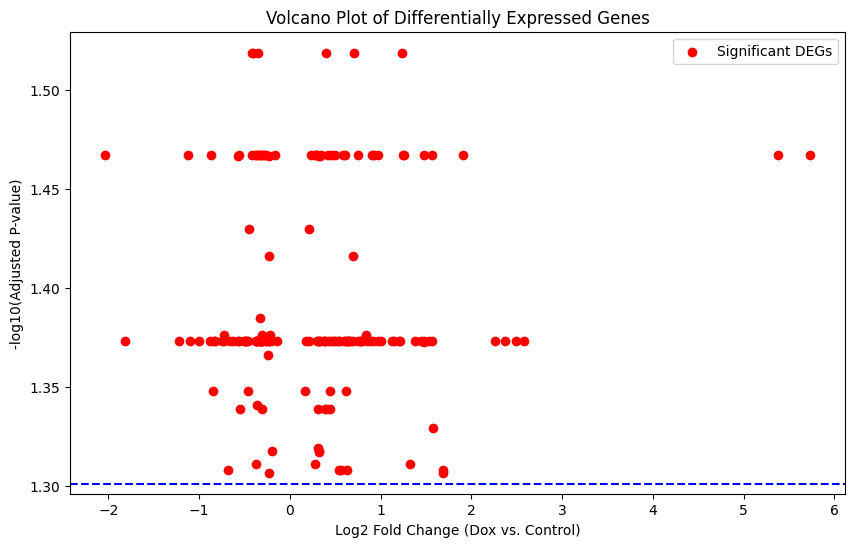

In [27]:
# Visualization - Volcano Plot
plt.figure(figsize=(10, 6))
plt.scatter(degs["Dox-Ctl_log2FC"], -np.log10(degs["adjusted_p_value"]), c="red", label="Significant DEGs")
plt.xlabel("Log2 Fold Change (Dox vs. Control)")
plt.ylabel("-log10(Adjusted P-value)")
plt.title("Volcano Plot of Differentially Expressed Genes")
plt.axhline(y=-np.log10(significance_threshold), color='blue', linestyle='--')
plt.legend()
plt.show()

The volcano plot shows the distribution of differentially expressed genes (DEGs) between Dox-treated and control conditions. Here’s an interpretation of the plot:

1. X-axis (Log2 Fold Change): This axis shows the log2 fold change in gene expression between Dox-treated and control groups.
- Genes with positive values are upregulated in Dox-treated samples.
- Genes with negative values are downregulated in Dox-treated samples.

2. Y-axis (-log10 Adjusted P-value): This axis represents the significance level (adjusted p-value) of each gene.
- Higher values indicate higher statistical significance.
- The blue dashed line represents the adjusted p-value threshold (0.05), and any points above this threshold are considered statistically significant DEGs.

3. Red Points: Each red dot represents a gene identified as significantly differentially expressed. The spread across the X-axis indicates variability in fold changes, with a few genes showing high fold changes.

### What Are Top Upregulated and Downregulated Genes?
- **Top Upregulated Genes:** These are the genes that show the highest positive change in expression levels in Dox-treated samples compared to control samples. This is measured by the log2 fold change (log2FC), where a higher positive log2FC means the gene's expression has increased significantly in Dox-treated samples. "Top" upregulated genes refer to those with the highest log2FC values, indicating the most substantial increase in expression due to treatment.

- **Top Downregulated Genes:** These are the genes with the highest negative change in expression levels, meaning their expression has decreased significantly in Dox-treated samples compared to controls. Here, the log2FC is a large negative value, representing a reduction in expression. "Top" downregulated genes are those with the lowest (most negative) log2FC values, showing the greatest suppression of expression due to treatment.

### Why Identify Top Upregulated and Downregulated Genes?
Finding the top upregulated and downregulated genes helps to understand which genes are most affected by the treatment (in this case, Dox-induced conditions). Analyzing these genes can reveal insights into biological pathways, regulatory mechanisms, or cellular responses related to the experimental treatment.

In [28]:
# Sort DEGs by log2 fold change to identify top upregulated and downregulated genes
# For top upregulated genes (sorted in descending order)
top_upregulated_genes = degs.sort_values(by="Dox-Ctl_log2FC", ascending=False).head(10)

# For top downregulated genes (sorted in ascending order)
top_downregulated_genes = degs.sort_values(by="Dox-Ctl_log2FC", ascending=True).head(10)

# Display the results
print("Top Upregulated Genes:")
print(top_upregulated_genes[["Gene", "Dox-Ctl_log2FC", "adjusted_p_value"]])

print("\nTop Downregulated Genes:")
print(top_downregulated_genes[["Gene", "Dox-Ctl_log2FC", "adjusted_p_value"]])


Top Upregulated Genes:
                  Gene  Dox-Ctl_log2FC  adjusted_p_value
158               SMPX        5.729245          0.034120
0                 CUBN        5.379797          0.034120
160    ENSG00000272405        2.583967          0.042310
12           LINC01806        2.496204          0.042310
159    ENSG00000286640        2.372303          0.042310
152              FOXP2        2.260017          0.042310
157             LOXHD1        1.908250          0.034120
155             AKR1C2        1.690288          0.049335
61              PCDHB9        1.687841          0.049193
54             PCDHB11        1.575749          0.046839

Top Downregulated Genes:
          Gene  Dox-Ctl_log2FC  adjusted_p_value
2        FGF19       -2.034191          0.034120
156       ETV7       -1.813110          0.042310
31      DPYSL5       -1.224091          0.042310
9     ANKRD13B       -1.123414          0.034120
64       SMPD5       -1.104607          0.042310
99      TRIM47       -1.004730

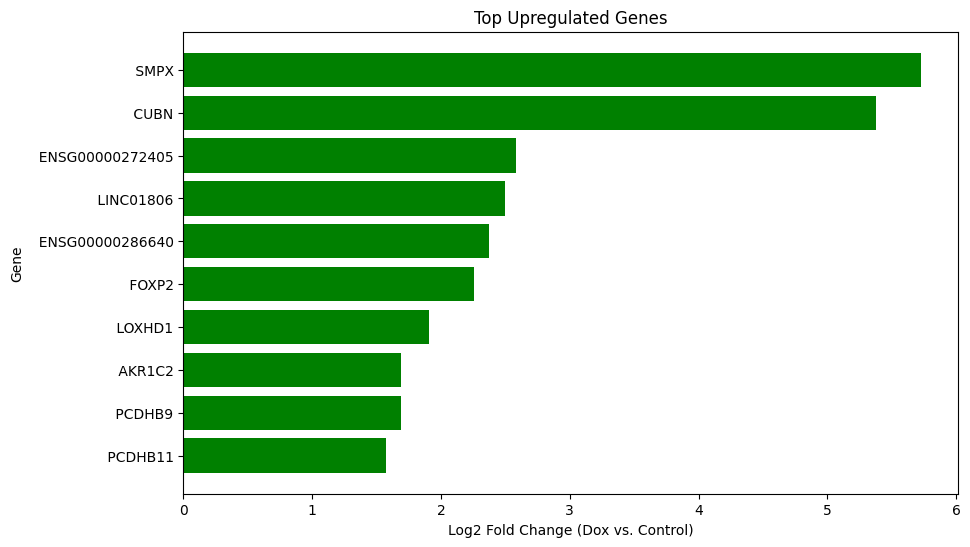

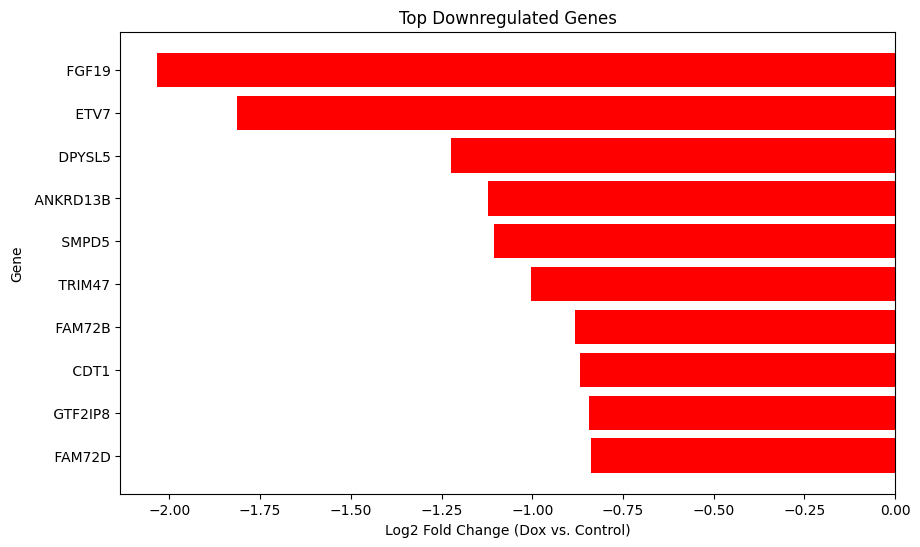

In [29]:
import matplotlib.pyplot as plt

# Plot for Top Upregulated Genes
plt.figure(figsize=(10, 6))
plt.barh(top_upregulated_genes["Gene"], top_upregulated_genes["Dox-Ctl_log2FC"], color="green")
plt.xlabel("Log2 Fold Change (Dox vs. Control)")
plt.ylabel("Gene")
plt.title("Top Upregulated Genes")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

# Plot for Top Downregulated Genes
plt.figure(figsize=(10, 6))
plt.barh(top_downregulated_genes["Gene"], top_downregulated_genes["Dox-Ctl_log2FC"], color="red")
plt.xlabel("Log2 Fold Change (Dox vs. Control)")
plt.ylabel("Gene")
plt.title("Top Downregulated Genes")
plt.gca().invert_yaxis()
plt.show()


----

# Enrichment Analysis

Conduct functional enrichment analysis using statistical methods to identify pathways associated with upregulated or downregulated genes.



In [30]:
top_upregulated_genes['Gene']

158                 SMPX
0                   CUBN
160      ENSG00000272405
12             LINC01806
159      ENSG00000286640
152                FOXP2
157               LOXHD1
155               AKR1C2
61                PCDHB9
54               PCDHB11
Name: Gene, dtype: object

In [31]:
top_downregulated_genes['Gene']

2          FGF19
156         ETV7
31        DPYSL5
9       ANKRD13B
64         SMPD5
99        TRIM47
39        FAM72B
3           CDT1
162      GTF2IP8
44        FAM72D
Name: Gene, dtype: object

In [32]:
# Define the gene lists
upregulated_genes = ["SMPX", "CUBN", "ENSG00000272405", "LINC01806", "ENSG00000286640", "FOXP2", "LOXHD1", "AKR1C2", "PCDHB9", "PCDHB11"]
downregulated_genes = ["FGF19", "ETV7", "DPYSL5", "ANKRD13B", "SMPD5", "TRIM47", "FAM72B", "CDT1", "GTF2IP8", "FAM72D"]

In [33]:
import gseapy as gp

# Run Enrichment Analysis for Upregulated Genes (e.g., GO Biological Process)
enrichr_results_up = gp.enrichr(gene_list=upregulated_genes,
                                gene_sets='GO_Biological_Process_2021',
                                organism='Human',  # or "Mouse" if applicable
                                outdir='enrichr_results/upregulated',
                                cutoff=0.05)  # Adjust cutoff as needed

# Display results
print(enrichr_results_up.res2d.head())



/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


                     Gene_set  \
0  GO_Biological_Process_2021   
1  GO_Biological_Process_2021   
2  GO_Biological_Process_2021   
3  GO_Biological_Process_2021   
4  GO_Biological_Process_2021   

                                                Term Overlap   P-value  \
0  calcium-dependent cell-cell adhesion via plasm...    2/36  0.000140   
1                      synapse assembly (GO:0007416)    2/69  0.000519   
2                cell junction assembly (GO:0034329)   2/102  0.001128   
3             steroid metabolic process (GO:0008202)   2/104  0.001173   
4                  synapse organization (GO:0050808)   2/126  0.001714   

   Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0          0.006462            0                     0  146.735294   
1          0.011926            0                     0   74.339552   
2          0.013487            0                     0   49.725000   
3          0.013487            0                     0   48.745098   
4     

The table above provides enrichment analysis results, highlighting the following columns:

- **Gene Set:** The specific gene ontology (GO) or pathway database used for the enrichment analysis, in this case, 'GO_Biological_Process_2021'.

- **Term:** Description of the biological process or pathway term identified as enriched (e.g., "calcium-dependent cell-cell adhesion via plasma membrane cell adhesion molecules").

- **Overlap:** Number of genes in our list that overlap with the genes in the specific term divided by the total genes in that term (e.g., 2/36).

- **P-value:** The probability of observing this level of overlap by chance, with lower values indicating stronger enrichment.

- **Adjusted P-value:** P-values adjusted for multiple testing (e.g., using Benjamini-Hochberg correction), which controls the false discovery rate.

- **Odds Ratio:** Measure of association, where higher values indicate stronger enrichment.

- **Combined Score:** Reflects the strength of the enrichment, often calculated based on both the P-value and the Odds Ratio.

- **Genes:** The specific genes from our input list that are associated with each term (e.g., "PCDHB11; PCDHB9").


#### Interpretation
- **Significant Terms:** Terms with low P-values and high odds ratios (e.g., “calcium-dependent cell-cell adhesion”) suggest that upregulated genes are involved in processes relevant to neuronal cell adhesion and synapse formation.

- **Pathway Relevance:** The high combined scores, especially for "calcium-dependent cell-cell adhesion," suggest a strong association of our genes with cell adhesion and synapse assembly, potentially indicating roles in neural network formation or stabilization.

/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


<Axes: title={'center': 'GO Biological Process (Upregulated Genes)'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

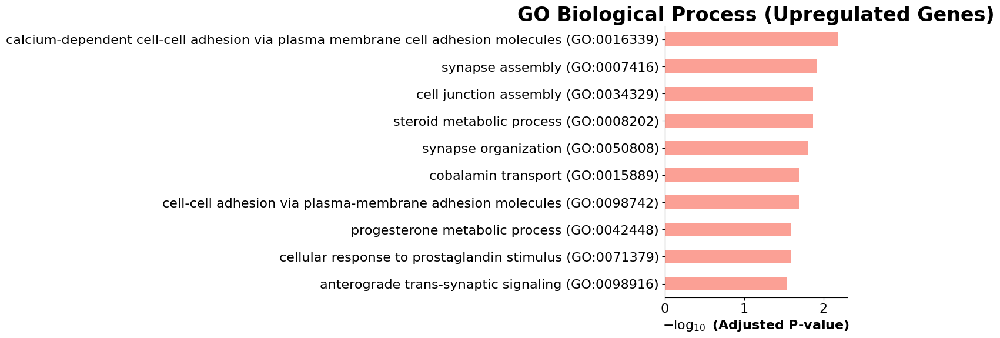

In [34]:
# Visualization of enrichment results (barplot for upregulated genes)
gp.barplot(enrichr_results_up.res2d, title='GO Biological Process (Upregulated Genes)', cutoff=0.05)

In [35]:
# Run Enrichment Analysis for Upregulated Genes (e.g., KEGG Pathways)
enrichr_results_up2 = gp.enrichr(gene_list=upregulated_genes,
                                gene_sets='KEGG_2021_Human',
                                organism='Human',  # or "Mouse" if applicable
                                outdir='enrichr_results/upregulated',
                                cutoff=0.05)  # Adjust cutoff as needed

# Display results
print(enrichr_results_up2.res2d.head())

/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


          Gene_set                              Term Overlap   P-value  \
0  KEGG_2021_Human  Vitamin digestion and absorption    1/24  0.011938   
1  KEGG_2021_Human      Steroid hormone biosynthesis    1/61  0.030091   
2  KEGG_2021_Human           Chemical carcinogenesis   1/239  0.113298   

   Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0          0.035814            0                     0   96.458937   
1          0.045137            0                     0   36.907407   
2          0.113298            0                     0    9.221289   

   Combined Score   Genes  
0      427.123227    CUBN  
1      129.305852  AKR1C2  
2       20.081491  AKR1C2  


/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


<Axes: title={'center': 'KEGG Pathways (Upregulated Genes)'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

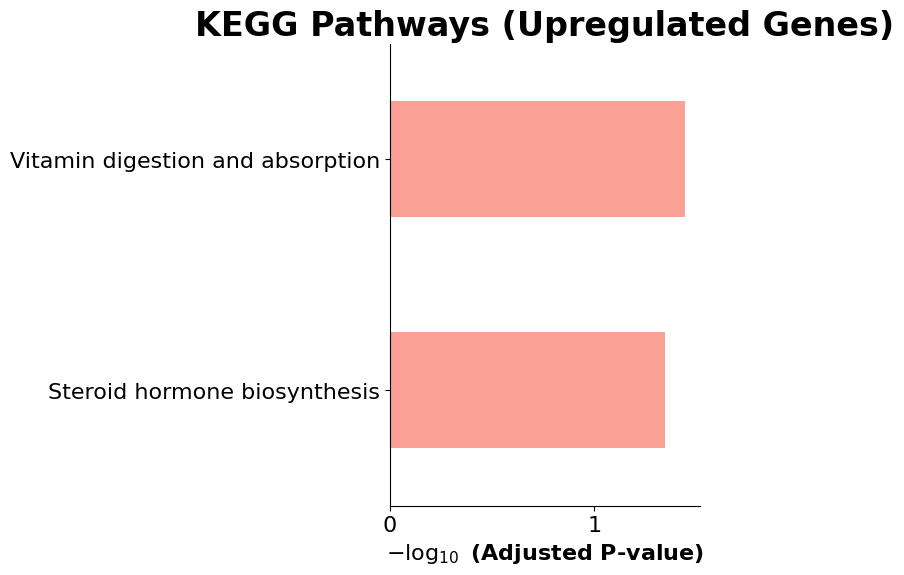

In [36]:
# Visualization of enrichment results (barplot for upregulated genes)
gp.barplot(enrichr_results_up2.res2d, title='KEGG Pathways (Upregulated Genes)', cutoff=0.05)

In [37]:
# Run Enrichment Analysis for Downregulated Genes (e.g., GO Biological Process)
enrichr_results_down = gp.enrichr(gene_list=downregulated_genes,
                                  gene_sets='GO_Biological_Process_2021',
                                  organism='Human',
                                  outdir='enrichr_results/downregulated',
                                  cutoff=0.2)

# Display results
print(enrichr_results_down.res2d.head())

/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


                     Gene_set  \
0  GO_Biological_Process_2021   
1  GO_Biological_Process_2021   
2  GO_Biological_Process_2021   
3  GO_Biological_Process_2021   
4  GO_Biological_Process_2021   

                                                Term Overlap   P-value  \
0  regulation of DNA-dependent DNA replication in...     1/6  0.002997   
1          nucleobase catabolic process (GO:0046113)     1/7  0.003495   
2  pyrimidine nucleobase catabolic process (GO:00...     1/8  0.003994   
3  negative regulation of macromolecule metabolic...   2/194  0.004002   
4  positive regulation of chromatin binding (GO:0...     1/9  0.004492   

   Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0          0.038213            0                     0  444.111111   
1          0.038213            0                     0  370.074074   
2          0.038213            0                     0  317.190476   
3          0.038213            0                     0   25.778646   
4     

/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


<Axes: title={'center': 'GO Biological Process (Downregulated Genes)'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

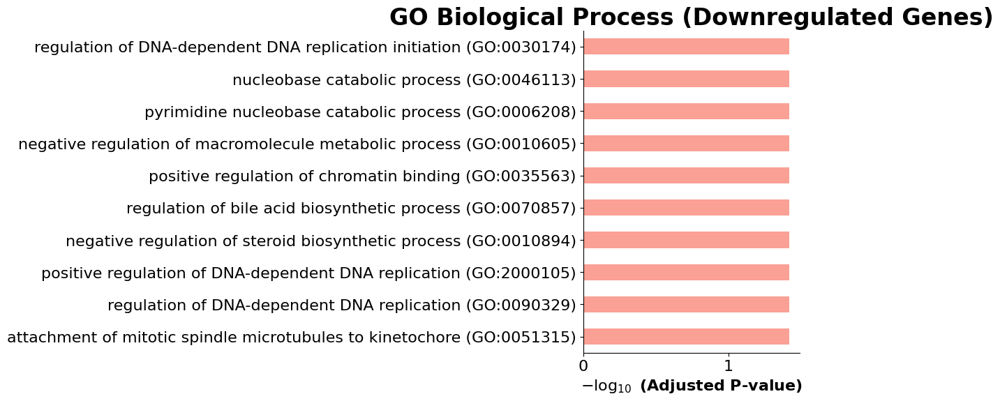

In [38]:
gp.barplot(enrichr_results_down.res2d, title='GO Biological Process (Downregulated Genes)', cutoff=0.2)

In [39]:
# Run Enrichment Analysis for Downregulated Genes (e.g., KEGG Pathways)
enrichr_results_down2 = gp.enrichr(gene_list=downregulated_genes,
                                  gene_sets='KEGG_2021_Human',
                                  organism='Human',
                                  outdir='enrichr_results/downregulated',
                                  cutoff=0.2)

# Display results
print(enrichr_results_down.res2d.head())

/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


                     Gene_set  \
0  GO_Biological_Process_2021   
1  GO_Biological_Process_2021   
2  GO_Biological_Process_2021   
3  GO_Biological_Process_2021   
4  GO_Biological_Process_2021   

                                                Term Overlap   P-value  \
0  regulation of DNA-dependent DNA replication in...     1/6  0.002997   
1          nucleobase catabolic process (GO:0046113)     1/7  0.003495   
2  pyrimidine nucleobase catabolic process (GO:00...     1/8  0.003994   
3  negative regulation of macromolecule metabolic...   2/194  0.004002   
4  positive regulation of chromatin binding (GO:0...     1/9  0.004492   

   Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0          0.038213            0                     0  444.111111   
1          0.038213            0                     0  370.074074   
2          0.038213            0                     0  317.190476   
3          0.038213            0                     0   25.778646   
4     

/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: The 'method' keyword in Series.replace is deprecated and will be removed in a future version.
  df[self.colname].replace(
/Users/samaneh/opt/anaconda3/envs/myvenv/lib/python3.12/site-packages/gseapy/plot.py:694: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[self.colname].replace(


<Axes: title={'center': 'KEGG Pathways (Downregulated Genes)'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

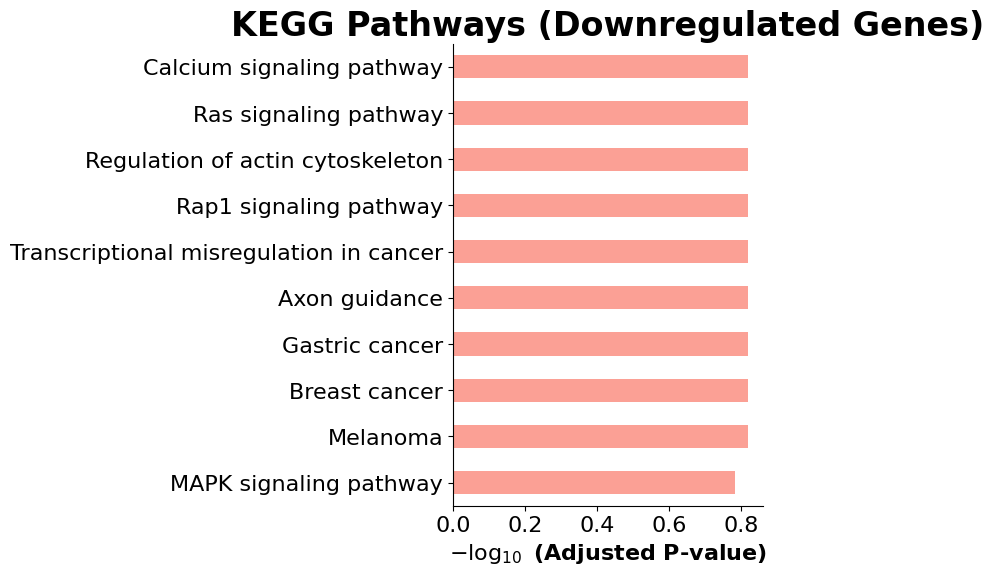

In [40]:
gp.barplot(enrichr_results_down2.res2d, title='KEGG Pathways (Downregulated Genes)', cutoff=0.2)